### Some notes
- sub-CC00657XX14 had two scans, one at age 29.85 and one at age 41. The earlier scan had a radiology score of 1 and the latter had a score of 3 (Incidental findings with unlikely clinical significance but possible analysis significance)

### Import Libraries

In [26]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import torch.distributions as dist
from torchsummary import summary
import math
import os
import numpy as np
import time
import matplotlib.pyplot as plt
from prettytable import PrettyTable
from sklearn.model_selection import train_test_split
from tqdm import tqdm
from pathlib import Path
import re
from skimage.metrics  import structural_similarity as ssim

from importlib import reload
import visualization

# locals
import model_architectures

reload(model_architectures)
from model_architectures import VAE, Data3D

reload(visualization)
from visualization import brain_diff

### Define Paths

In [27]:
research_dir = r"D:/school/research"
code_dir = os.path.join(research_dir, "code")
model_dir = os.path.join(code_dir, "explore_again", "models")
data_dir = os.path.join(research_dir, "data")
dhcp_rel2 = os.path.join(data_dir, "dhcp_rel2")
processed_dir = os.path.join(dhcp_rel2, "processed")
volume_dir = os.path.join(processed_dir, "volumes")
l1_dir = os.path.join(volume_dir, "l1")
l5_dir = os.path.join(volume_dir, "l5")

### Get Data

In [28]:
np.random.seed(42)
num_samples = int(len(os.listdir(l1_dir)) / 2)
samples = np.array([i for i in range(0, num_samples)])
np.random.shuffle(samples)

split_val = int(0.8 * num_samples)
train_indices = samples[0:split_val]
val_indices = samples[split_val:]

num_test = int(len(os.listdir(l5_dir)) / 2)
test_indices = np.array([i for i in range(0, num_test)])

In [29]:
train = Data3D(l1_dir, train_indices, t2_only=False)
val = Data3D(l1_dir, val_indices, t2_only=False)
test = Data3D(l5_dir, test_indices, t2_only=False)

batch_size = 1
train_loader = DataLoader(train, batch_size=batch_size)#, num_workers=1)
val_loader = DataLoader(val, batch_size=batch_size)#, num_workers=1)

In [34]:
train.get_subject("CC00087AN14")

IndexError: list index out of range

### Quick Visualization

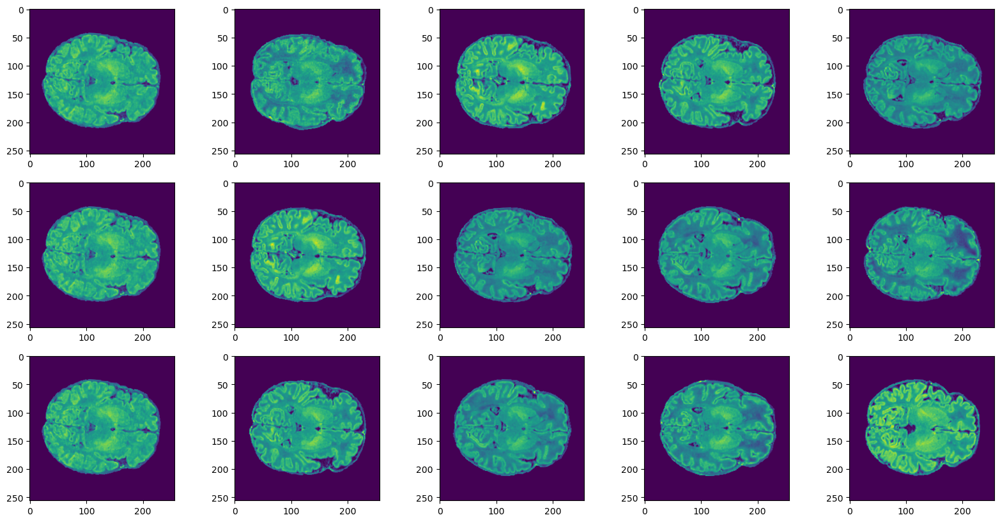

In [5]:
%matplotlib inline

f, axarr = plt.subplots(3, 5, figsize=(20, 10))
cmap = plt.get_cmap('viridis')

for r in range(0,3):
    for i in range(0, 5):
        z = math.ceil(train[i*(r+1)][0].shape[2]/2)
        axarr[r][i].imshow(train[i*(r+1)][0][:,:,z], cmap=cmap)

### T1/T2 VAE

In [44]:
model = VAE(2)
# summary(model.cuda(), (1, 256, 256, 256))


# model = nn.DataParallel(model)
model.cuda()
criterion = nn.MSELoss()
learning_rate = 1e-3
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate, eps=1e-07)

num_epochs = 50
# this works for batch size of 128, c=1
for epoch in range(num_epochs):
    total_loss = 0
    with tqdm(train_loader, unit="batch", ascii=' >=') as tepoch:
        model.train()
        data_counter = 0
        for data in tepoch:
            # clear gradients
            optimizer.zero_grad()
            
            # forward
            x = data.cuda()
            output = model(x)
            loss = criterion(x, output)
            
            # backward
            
            loss.backward()
            optimizer.step()
            
            total_loss += loss.data
            data_counter += 1
        ## This is probably more memory efficient but doesn't appear necessary in this case
        # del x
        # del output
        # torch.cuda.empty_cache()
        
        total_loss /= data_counter
            
        tepoch.set_postfix(loss=loss.item())
        val_loss = 0
        model.eval()
        data_counter = 0
        for data in val_loader:
            with torch.no_grad():
                x = data.cuda()
                output = model(x)
                loss = criterion(x, output)

                val_loss += loss.data
                data_counter += 1
        
        val_loss /= data_counter
        
        print('epoch [{}/{}], train_loss:{:.4f}, val_loss:{:.4f}'
              .format(epoch+1, num_epochs, total_loss, val_loss))

100%|=============================================================================| 166/166 [00:55<00:00,  3.00batch/s]


epoch [1/50], train_loss:0.0204, val_loss:0.0049


100%|=============================================================================| 166/166 [00:57<00:00,  2.91batch/s]


epoch [2/50], train_loss:0.0046, val_loss:0.0045


100%|=============================================================================| 166/166 [00:56<00:00,  2.92batch/s]


epoch [3/50], train_loss:0.0044, val_loss:0.0043


100%|=============================================================================| 166/166 [00:57<00:00,  2.91batch/s]


epoch [4/50], train_loss:0.0043, val_loss:0.0042


100%|=============================================================================| 166/166 [00:56<00:00,  2.96batch/s]


epoch [5/50], train_loss:0.0042, val_loss:0.0041


100%|=============================================================================| 166/166 [00:55<00:00,  3.01batch/s]


epoch [6/50], train_loss:0.0041, val_loss:0.0041


100%|=============================================================================| 166/166 [00:56<00:00,  2.93batch/s]


epoch [7/50], train_loss:0.0040, val_loss:0.0040


100%|=============================================================================| 166/166 [00:56<00:00,  2.96batch/s]


epoch [8/50], train_loss:0.0039, val_loss:0.0039


100%|=============================================================================| 166/166 [00:55<00:00,  3.00batch/s]


epoch [9/50], train_loss:0.0039, val_loss:0.0039


100%|=============================================================================| 166/166 [00:54<00:00,  3.02batch/s]


epoch [10/50], train_loss:0.0038, val_loss:0.0038


100%|=============================================================================| 166/166 [00:55<00:00,  2.97batch/s]


epoch [11/50], train_loss:0.0038, val_loss:0.0037


100%|=============================================================================| 166/166 [00:54<00:00,  3.07batch/s]


epoch [12/50], train_loss:0.0037, val_loss:0.0037


100%|=============================================================================| 166/166 [00:56<00:00,  2.92batch/s]


epoch [13/50], train_loss:0.0037, val_loss:0.0037


100%|=============================================================================| 166/166 [00:55<00:00,  3.02batch/s]


epoch [14/50], train_loss:0.0037, val_loss:0.0036


100%|=============================================================================| 166/166 [00:54<00:00,  3.05batch/s]


epoch [15/50], train_loss:0.0036, val_loss:0.0036


100%|=============================================================================| 166/166 [00:58<00:00,  2.85batch/s]


epoch [16/50], train_loss:0.0036, val_loss:0.0036


100%|=============================================================================| 166/166 [00:56<00:00,  2.94batch/s]


epoch [17/50], train_loss:0.0035, val_loss:0.0036


100%|=============================================================================| 166/166 [00:55<00:00,  3.01batch/s]


epoch [18/50], train_loss:0.0035, val_loss:0.0035


100%|=============================================================================| 166/166 [00:54<00:00,  3.03batch/s]


epoch [19/50], train_loss:0.0035, val_loss:0.0034


100%|=============================================================================| 166/166 [00:54<00:00,  3.04batch/s]


epoch [20/50], train_loss:0.0034, val_loss:0.0034


100%|=============================================================================| 166/166 [00:56<00:00,  2.95batch/s]


epoch [21/50], train_loss:0.0034, val_loss:0.0033


100%|=============================================================================| 166/166 [00:54<00:00,  3.03batch/s]


epoch [22/50], train_loss:0.0033, val_loss:0.0034


100%|=============================================================================| 166/166 [00:55<00:00,  2.99batch/s]


epoch [23/50], train_loss:0.0033, val_loss:0.0033


100%|=============================================================================| 166/166 [00:55<00:00,  2.98batch/s]


epoch [24/50], train_loss:0.0032, val_loss:0.0033


100%|=============================================================================| 166/166 [00:56<00:00,  2.96batch/s]


epoch [25/50], train_loss:0.0033, val_loss:0.0037


100%|=============================================================================| 166/166 [00:54<00:00,  3.02batch/s]


epoch [26/50], train_loss:0.0032, val_loss:0.0033


100%|=============================================================================| 166/166 [00:54<00:00,  3.02batch/s]


epoch [27/50], train_loss:0.0032, val_loss:0.0033


100%|=============================================================================| 166/166 [00:55<00:00,  3.01batch/s]


epoch [28/50], train_loss:0.0032, val_loss:0.0036


100%|=============================================================================| 166/166 [00:56<00:00,  2.94batch/s]


epoch [29/50], train_loss:0.0031, val_loss:0.0034


100%|=============================================================================| 166/166 [00:56<00:00,  2.92batch/s]


epoch [30/50], train_loss:0.0031, val_loss:0.0035


100%|=============================================================================| 166/166 [00:56<00:00,  2.93batch/s]


epoch [31/50], train_loss:0.0032, val_loss:0.0039


100%|=============================================================================| 166/166 [00:55<00:00,  2.99batch/s]


epoch [32/50], train_loss:0.0032, val_loss:0.0033


100%|=============================================================================| 166/166 [00:55<00:00,  2.98batch/s]


epoch [33/50], train_loss:0.0030, val_loss:0.0035


100%|=============================================================================| 166/166 [00:55<00:00,  3.00batch/s]


epoch [34/50], train_loss:0.0030, val_loss:0.0034


100%|=============================================================================| 166/166 [00:56<00:00,  2.95batch/s]


epoch [35/50], train_loss:0.0030, val_loss:0.0038


100%|=============================================================================| 166/166 [00:56<00:00,  2.94batch/s]


epoch [36/50], train_loss:0.0029, val_loss:0.0035


100%|=============================================================================| 166/166 [00:55<00:00,  2.98batch/s]


epoch [37/50], train_loss:0.0028, val_loss:0.0034


100%|=============================================================================| 166/166 [00:55<00:00,  2.98batch/s]


epoch [38/50], train_loss:0.0028, val_loss:0.0038


100%|=============================================================================| 166/166 [00:54<00:00,  3.02batch/s]


epoch [39/50], train_loss:0.0028, val_loss:0.0035


100%|=============================================================================| 166/166 [00:55<00:00,  3.01batch/s]


epoch [40/50], train_loss:0.0029, val_loss:0.0034


100%|=============================================================================| 166/166 [00:54<00:00,  3.03batch/s]


epoch [41/50], train_loss:0.0028, val_loss:0.0034


100%|=============================================================================| 166/166 [00:53<00:00,  3.10batch/s]


epoch [42/50], train_loss:0.0027, val_loss:0.0032


100%|=============================================================================| 166/166 [00:53<00:00,  3.12batch/s]


epoch [43/50], train_loss:0.0027, val_loss:0.0036


100%|=============================================================================| 166/166 [00:55<00:00,  3.01batch/s]


epoch [44/50], train_loss:0.0027, val_loss:0.0034


100%|=============================================================================| 166/166 [00:55<00:00,  2.99batch/s]


epoch [45/50], train_loss:0.0026, val_loss:0.0032


100%|=============================================================================| 166/166 [00:56<00:00,  2.96batch/s]


epoch [46/50], train_loss:0.0027, val_loss:0.0032


100%|=============================================================================| 166/166 [00:55<00:00,  2.97batch/s]


epoch [47/50], train_loss:0.0028, val_loss:0.0032


100%|=============================================================================| 166/166 [00:56<00:00,  2.96batch/s]


epoch [48/50], train_loss:0.0027, val_loss:0.0033


100%|=============================================================================| 166/166 [00:57<00:00,  2.90batch/s]


epoch [49/50], train_loss:0.0026, val_loss:0.0036


100%|=============================================================================| 166/166 [00:54<00:00,  3.06batch/s]


epoch [50/50], train_loss:0.0026, val_loss:0.0035


### Save Model

In [100]:
model_path = os.path.join(model_dir, "vae_rel2_t1_t2_second_session.pt")
torch.save(model.state_dict(), model_path)

### Load Model

In [6]:
model_path = os.path.join(model_dir, "vae_rel2_t1_t2_second_session.pt")
model = VAE(2)
model.load_state_dict(torch.load(model_path))
model.cuda()
model.eval()

VAE(
  (model): Sequential(
    (0): ResnetEncoder(
      (pass1): Sequential(
        (0): InstanceNorm3d(2, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(2, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (pass2): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (conv_bypass): Conv3d(2, 32, kernel_size=(3, 3, 3), stride=(4, 4, 4))
      (activation_bypass): ReLU()
    )
    (1): ResnetEncoder(
      (pass1): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (1): ReLU()
        (2): Conv3d(32, 32, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
      )
      (pass2): Sequential(
        (0): InstanceNorm3d(32, eps=1e-05, momentum=0.1, aff

### Explore Losses

In [10]:
%%time
criterion = nn.MSELoss()

train_losses = []
for img in train:
    x = torch.Tensor(np.reshape(img, (1, 2, 256, 256, 256))).cuda()
    output = model(x)
    train_losses.append(float(criterion(x, output).cpu()))   

CPU times: total: 42.6 s
Wall time: 48.6 s


In [11]:
%%time
val_losses = []
for img in val:
    x = torch.Tensor(np.reshape(img, (1, 2, 256, 256, 256))).cuda()
    output = model(x)
    val_losses.append(float(criterion(x, output).cpu()))   

CPU times: total: 10.7 s
Wall time: 12.2 s


In [12]:
%%time
test_losses = []
for img in test:
    x = torch.Tensor(np.reshape(img, (1, 2, 256, 256, 256))).cuda()
    output = model(x)
    test_losses.append(float(criterion(x, output).cpu()))   

CPU times: total: 6.94 s
Wall time: 7.96 s


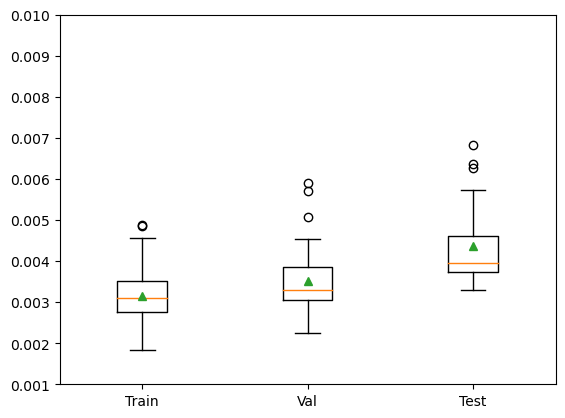

In [14]:
plt.ylim(0.001, 0.01)
bp = plt.boxplot(
    [train_losses, val_losses, test_losses],
    vert=True,
    labels=['Train', 'Val', 'Test'],
    showfliers=True,
    showmeans=True
)

(array([ 4.,  9., 27., 33., 36., 29., 13.,  7.,  6.,  2.]),
 array([0.00182408, 0.00212913, 0.00243418, 0.00273923, 0.00304428,
        0.00334933, 0.00365438, 0.00395943, 0.00426448, 0.00456953,
        0.00487458]),
 <BarContainer object of 10 artists>)

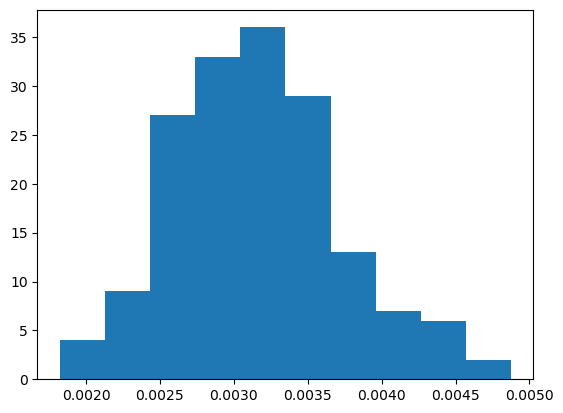

In [49]:
plt.hist(train_losses)

remaining samples:  132


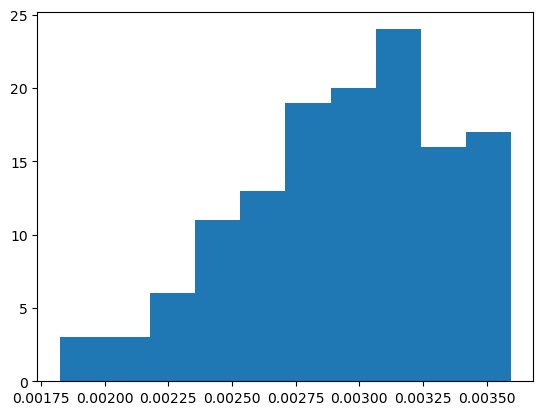

In [50]:
sorted_losses = sorted([(x, y) for x, y in enumerate(train_losses)], key=lambda x: x[1])
num_samples = int(len(sorted_losses) * 0.8)
print("remaining samples: ", num_samples)
reduced_losses = sorted_losses[0:num_samples]
res = plt.hist([x[1] for x in reduced_losses])

### Train Visualization

SSIM:  0.7555548040325484


D:\school\research\code\explore_again\modeling\multimodal\visualization.py:92: UserWarning: Trying to register the cmap 'above_mean' which already exists.
  plt.register_cmap(cmap=map_object)
D:\school\research\code\explore_again\modeling\multimodal\visualization.py:99: UserWarning: Trying to register the cmap 'below_mean' which already exists.
  plt.register_cmap(cmap=map_object)


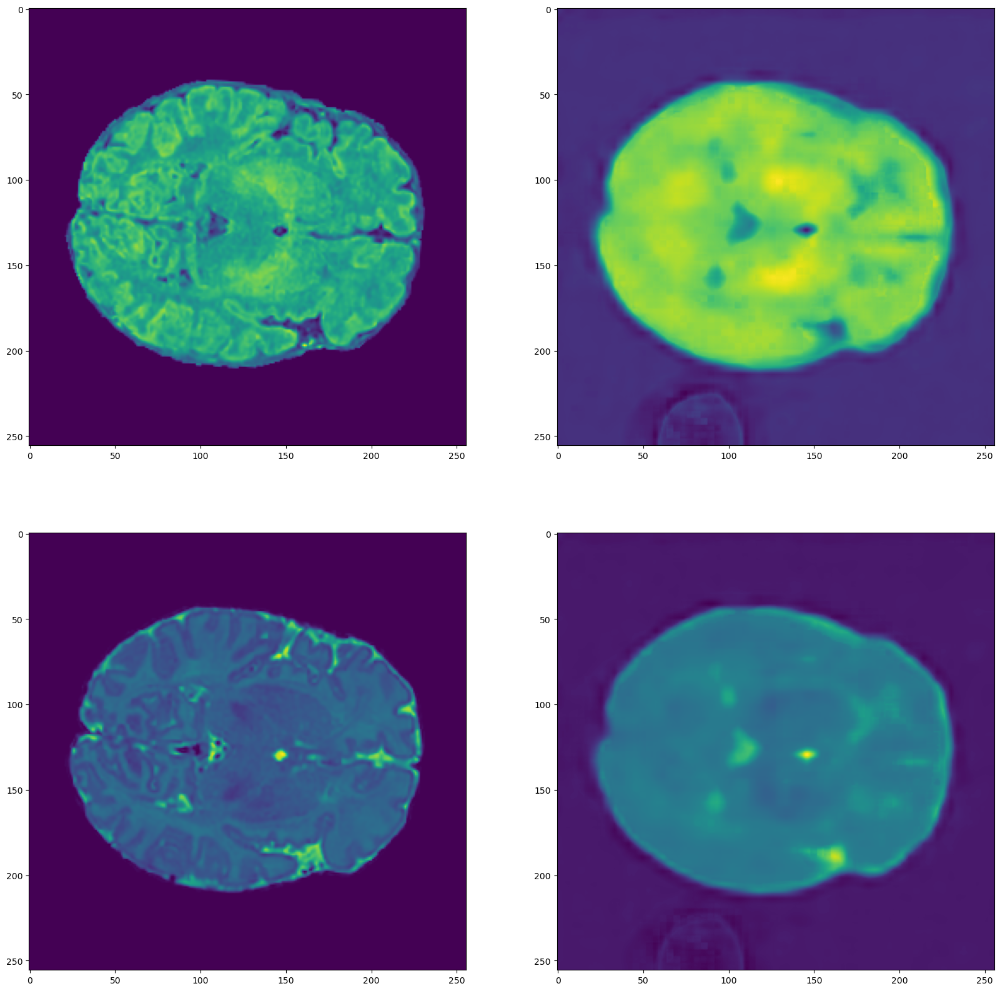

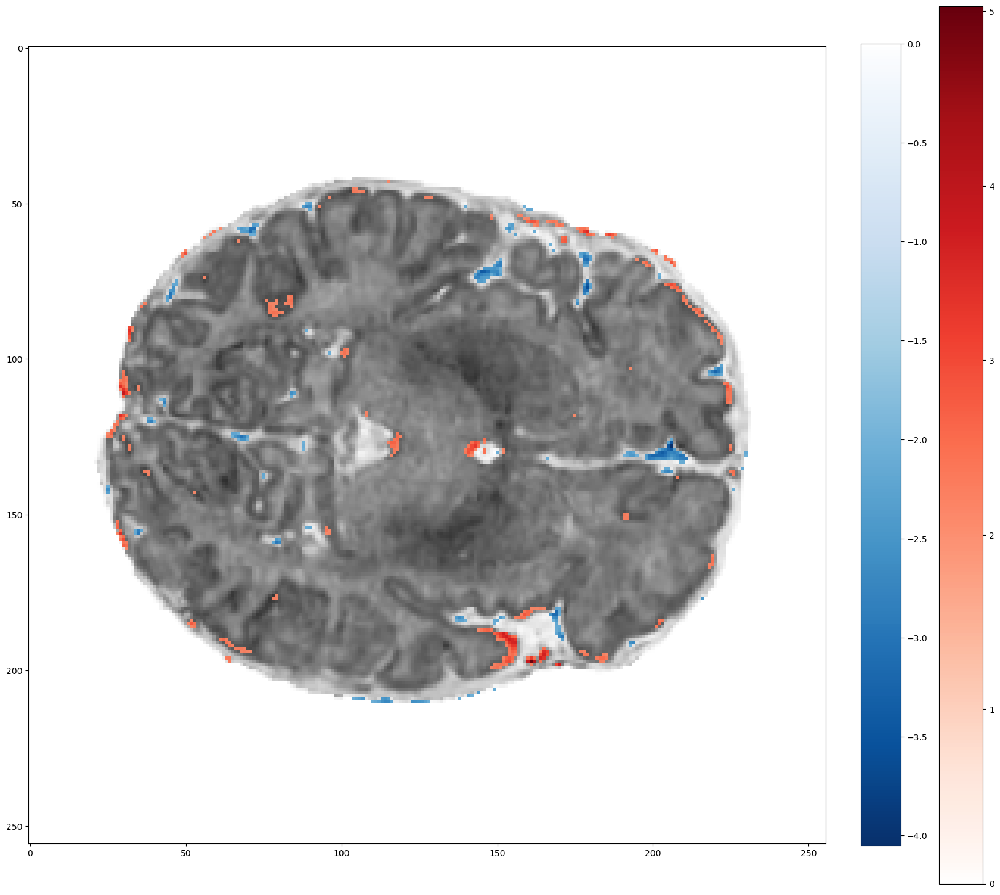

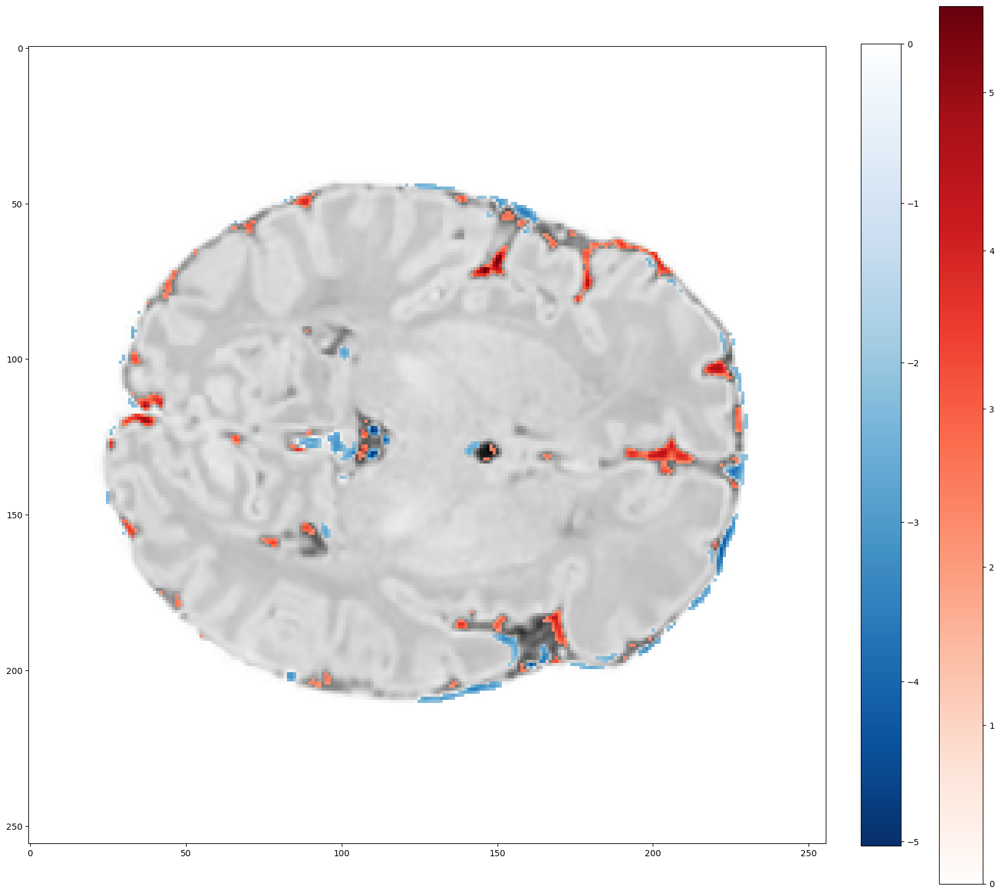

In [7]:
index = 0
s = 128
x = torch.Tensor(np.reshape(train[index], (1, 2, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (2, 256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (2, 256, 256, 256))

(score, diff) = ssim(og[0][:,:,s], pred[0][:,:,s], full=True)
print("SSIM: ", score)


fig, ax = plt.subplots(2, 2, figsize=(20,20))
ax[0][0].imshow(og[0][:,:,s])
ax[0][1].imshow(pred[0][:,:,s])
ax[1][0].imshow(og[1][:,:,s])
ax[1][1].imshow(pred[1][:,:,s])

brain_diff(og[0][:,:,s], pred[0][:,:,s], threshold=2)
brain_diff(og[1][:,:,s], pred[1][:,:,s], threshold=2)

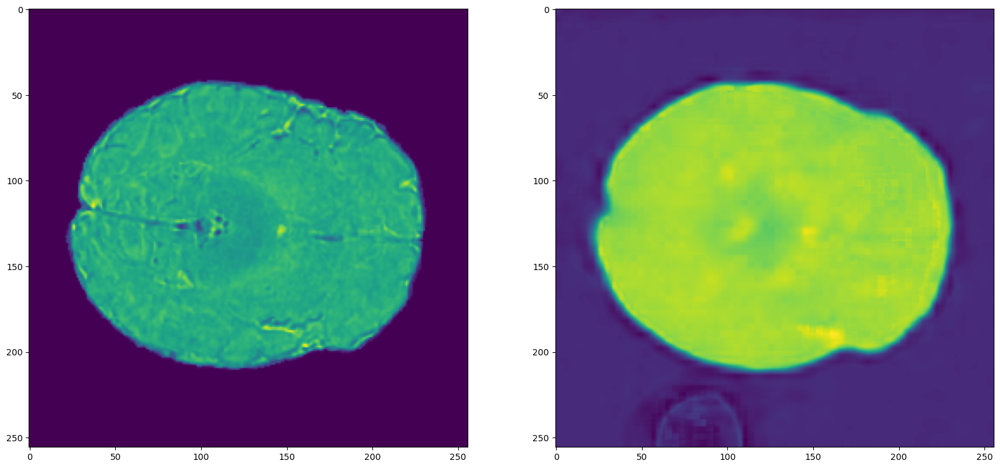

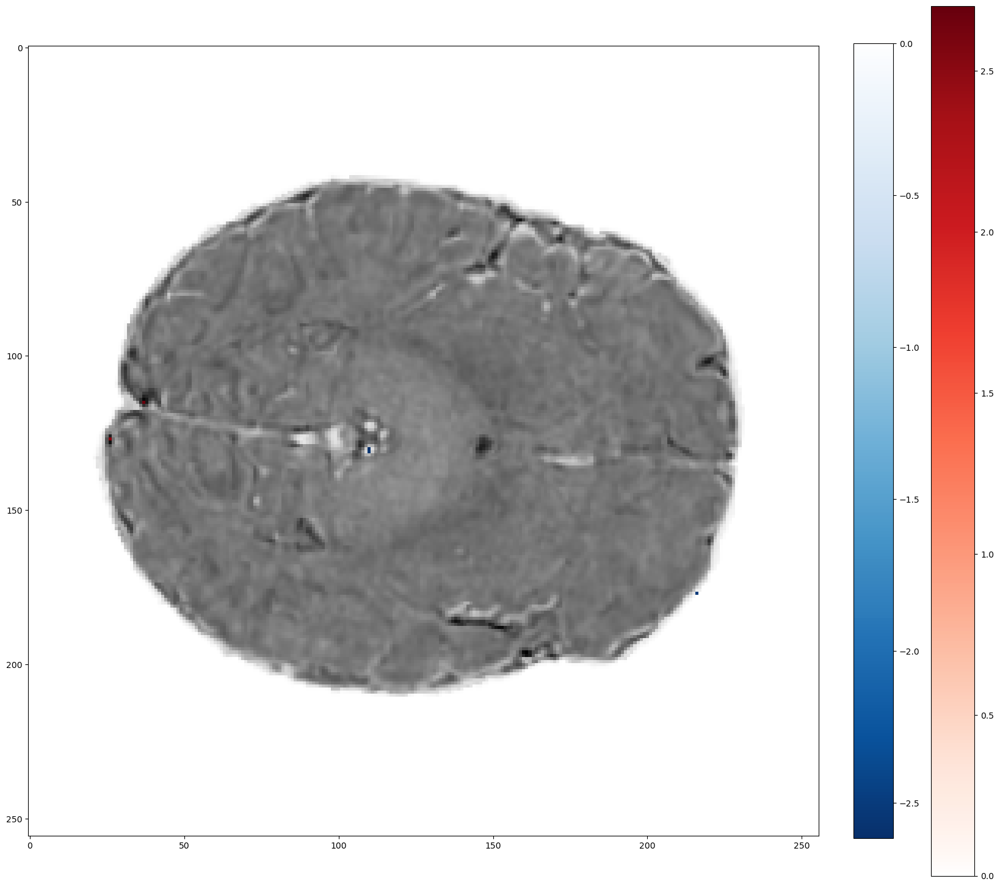

In [22]:
### Get diff on average of t1/t2

og_avg = (og[0] + og[1]) / 2
pred_avg = (pred[0] + pred[1]) / 2

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=2.5)

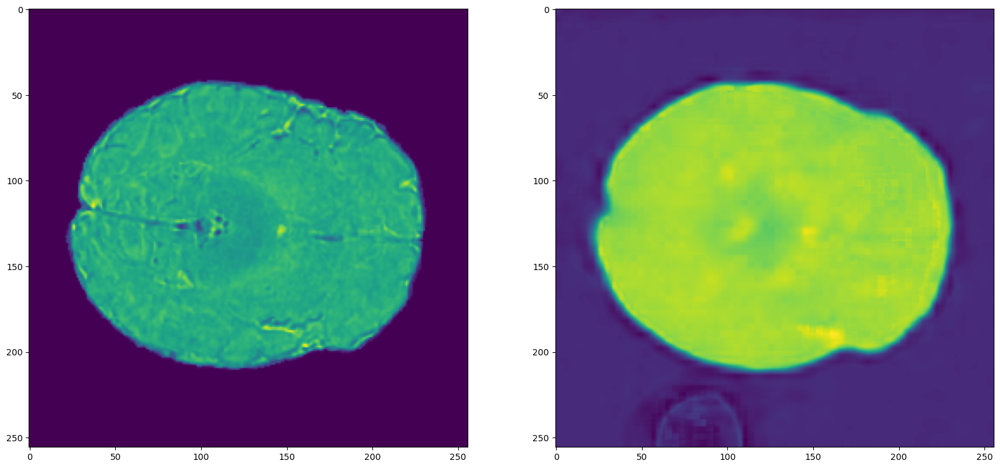

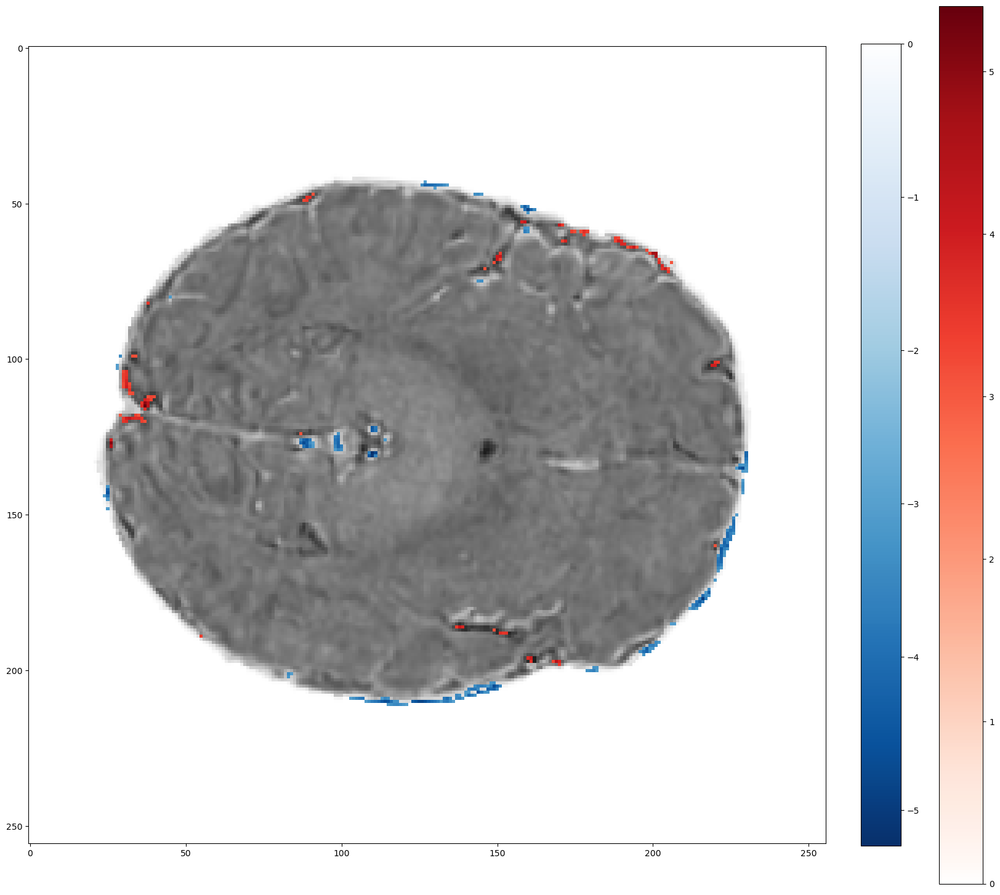

In [24]:
### Get diff on average of t1/t2

og_avg = (og[0] + og[1])
pred_avg = (pred[0] + pred[1])

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=3)

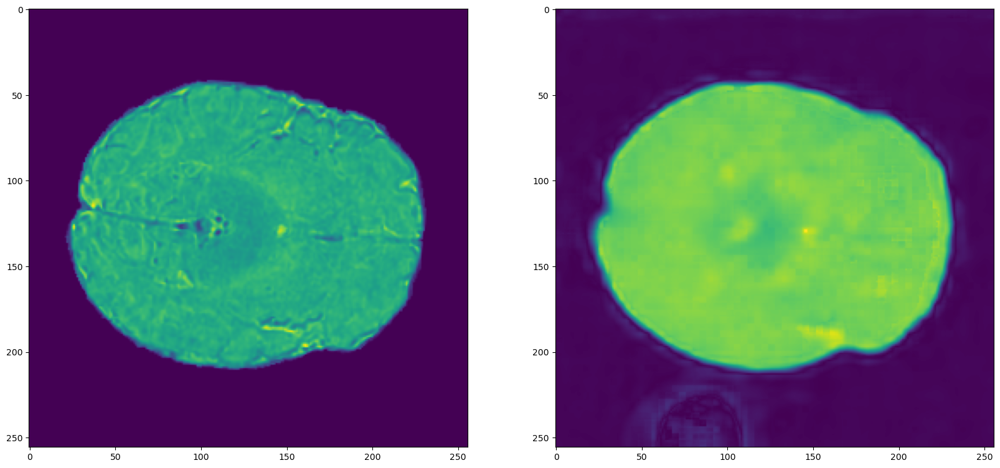

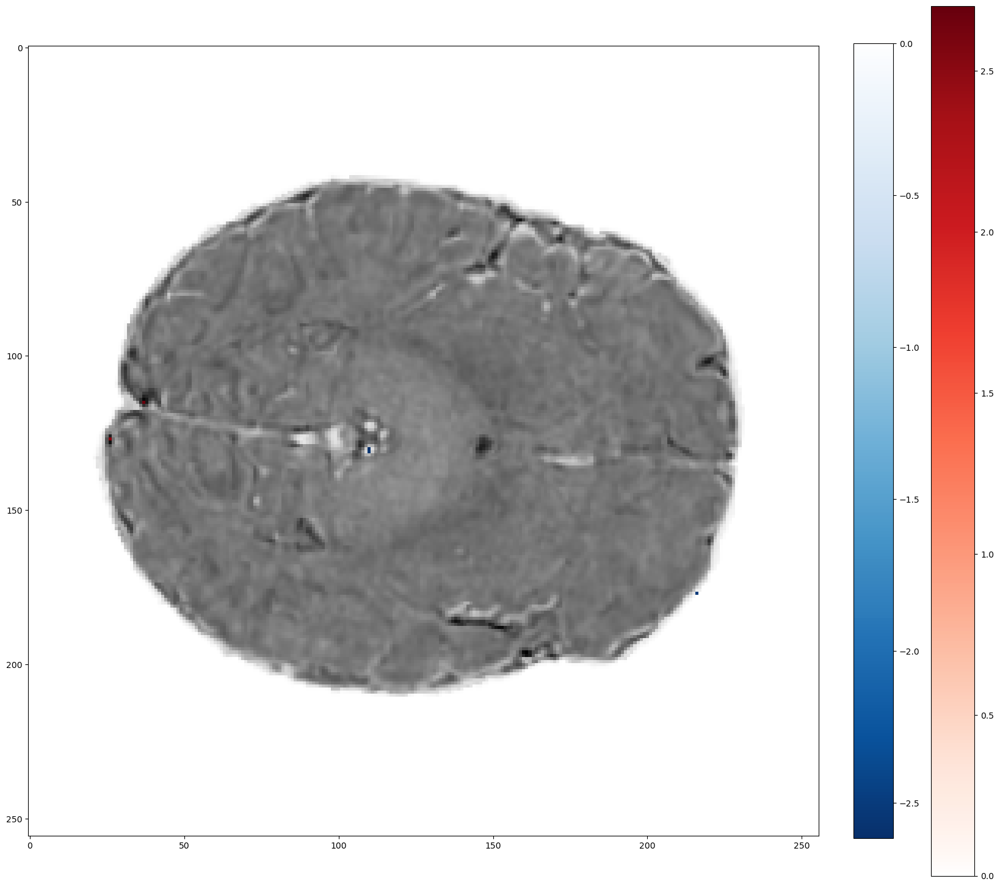

In [15]:
### Get diff on sum of t1/t2 (abs on pred)

og_avg = (og[0] + og[1]) / 2
pred_avg = (np.abs(pred[0]) + np.abs(pred[1])) / 2

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=2.5)

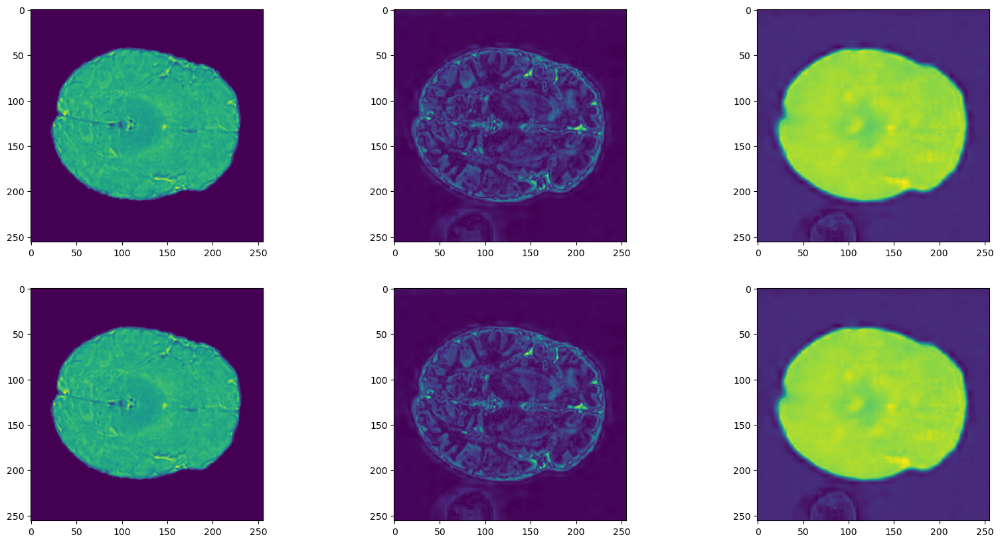

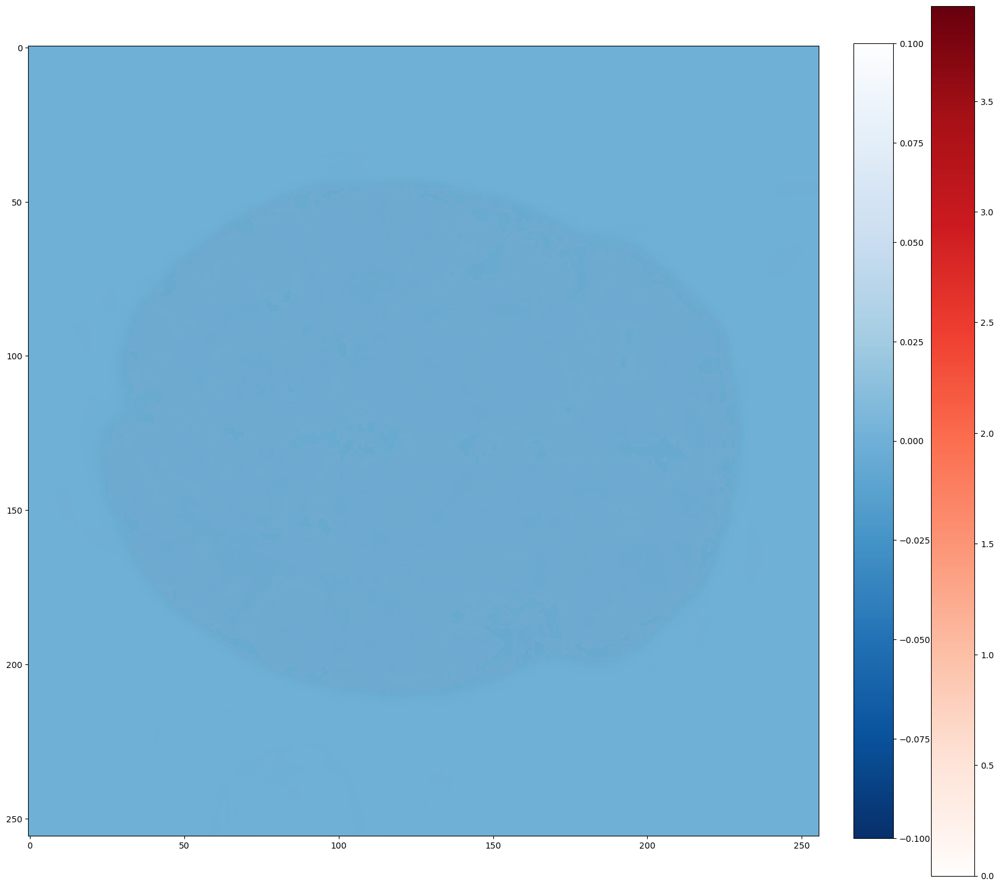

In [16]:
### Get diff on Absolute Values

t1_diff = og[0] - pred[0]
t2_diff = og[1] - pred[1]

og_sum = og[0] + og[1]
absolute_sum = np.abs(t1_diff) + np.abs(t2_diff)
pred_sum = (pred[0] + pred[1])

og_avg = og_sum / 2
absolute_avg = absolute_sum / 2
pred_avg = pred_sum / 2

fig, ax = plt.subplots(2, 3, figsize=(20,10))
ax[0][0].imshow(og_sum[:,:,128])
ax[0][1].imshow(absolute_sum[:,:,128])
ax[0][2].imshow(pred_sum[:,:,128])
ax[1][0].imshow(og_avg[:,:,128])
ax[1][1].imshow(absolute_avg[:,:,128])
ax[1][2].imshow(pred_avg[:,:,128])

brain_diff(pred_avg[:,:,128], absolute_avg[:,:,128], threshold=2)

### Val Visualization

SSIM:  0.7676122734805092


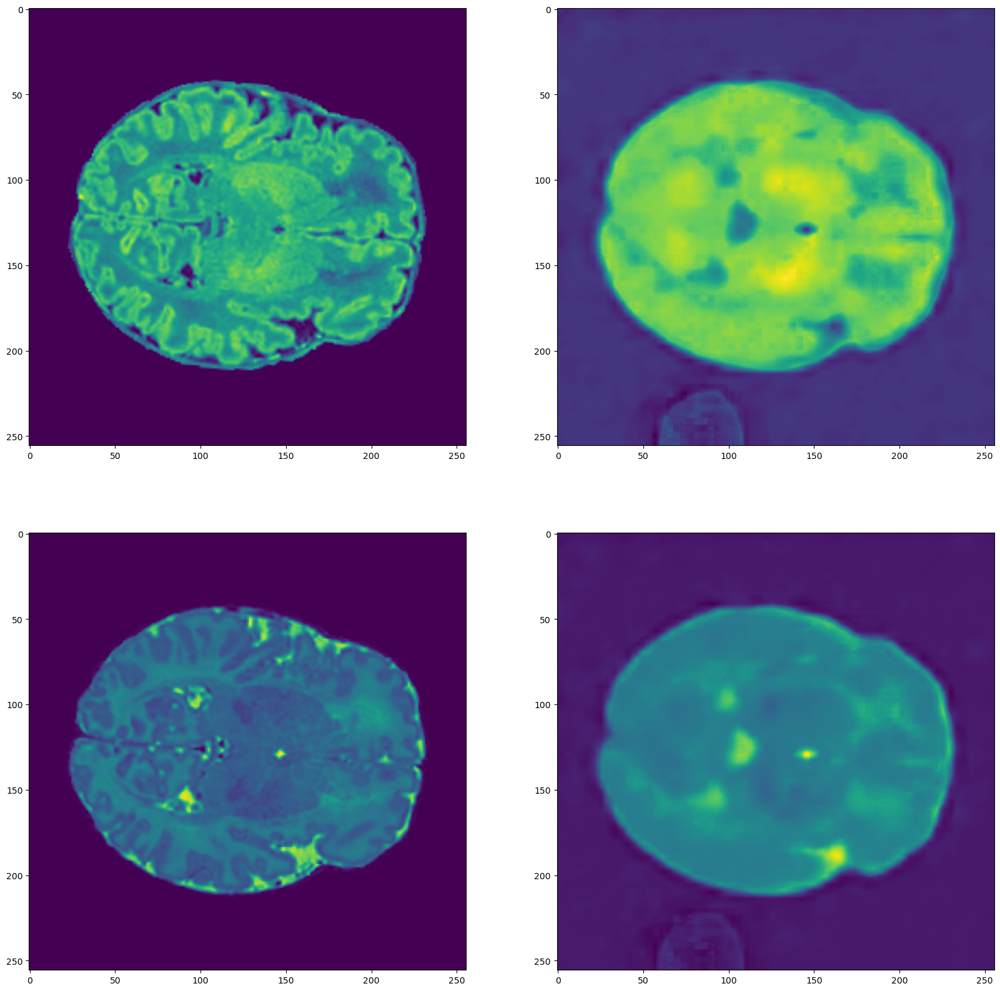

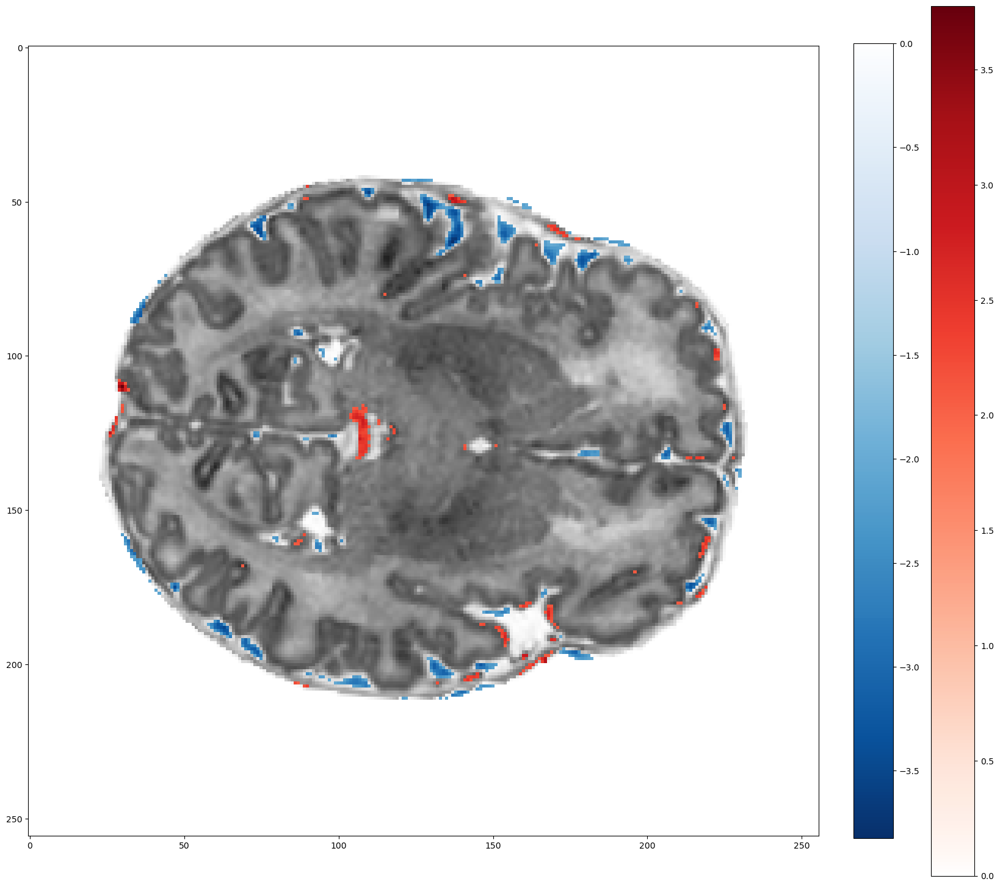

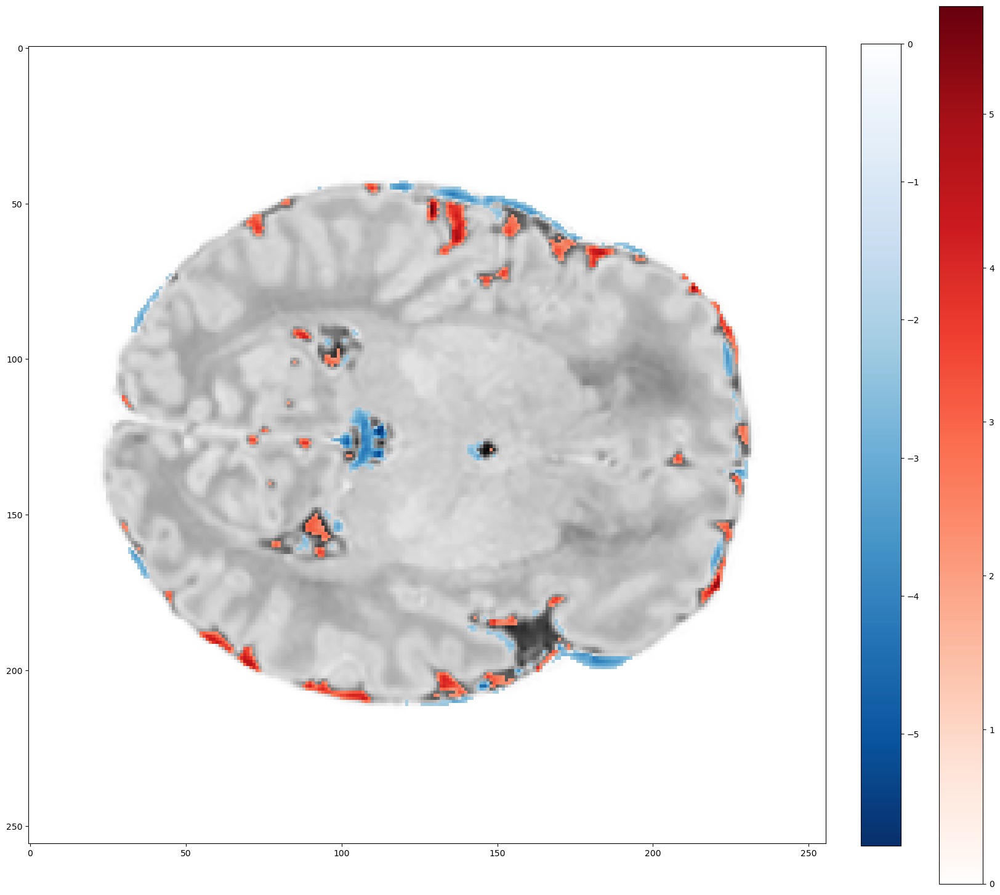

In [17]:
index = 1
x = torch.Tensor(np.reshape(val[index], (1, 2, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (2, 256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (2, 256, 256, 256))

(score, diff) = ssim(og[0][:,:,s], pred[0][:,:,s], full=True)
print("SSIM: ", score)

s = 128
fig, ax = plt.subplots(2, 2, figsize=(20,20))
ax[0][0].imshow(og[0][:,:,s])
ax[0][1].imshow(pred[0][:,:,s])
ax[1][0].imshow(og[1][:,:,s])
ax[1][1].imshow(pred[1][:,:,s])

brain_diff(og[0][:,:,s], pred[0][:,:,s], threshold=2)
brain_diff(og[1][:,:,s], pred[1][:,:,s], threshold=2)

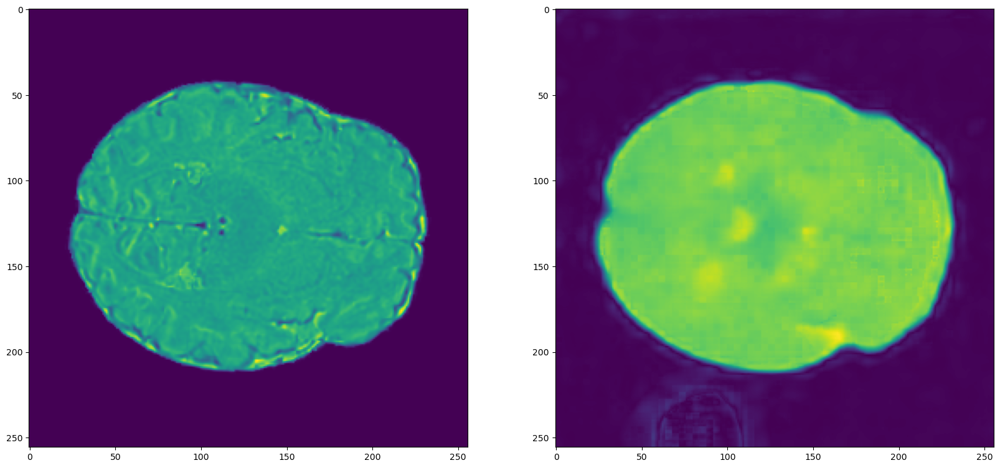

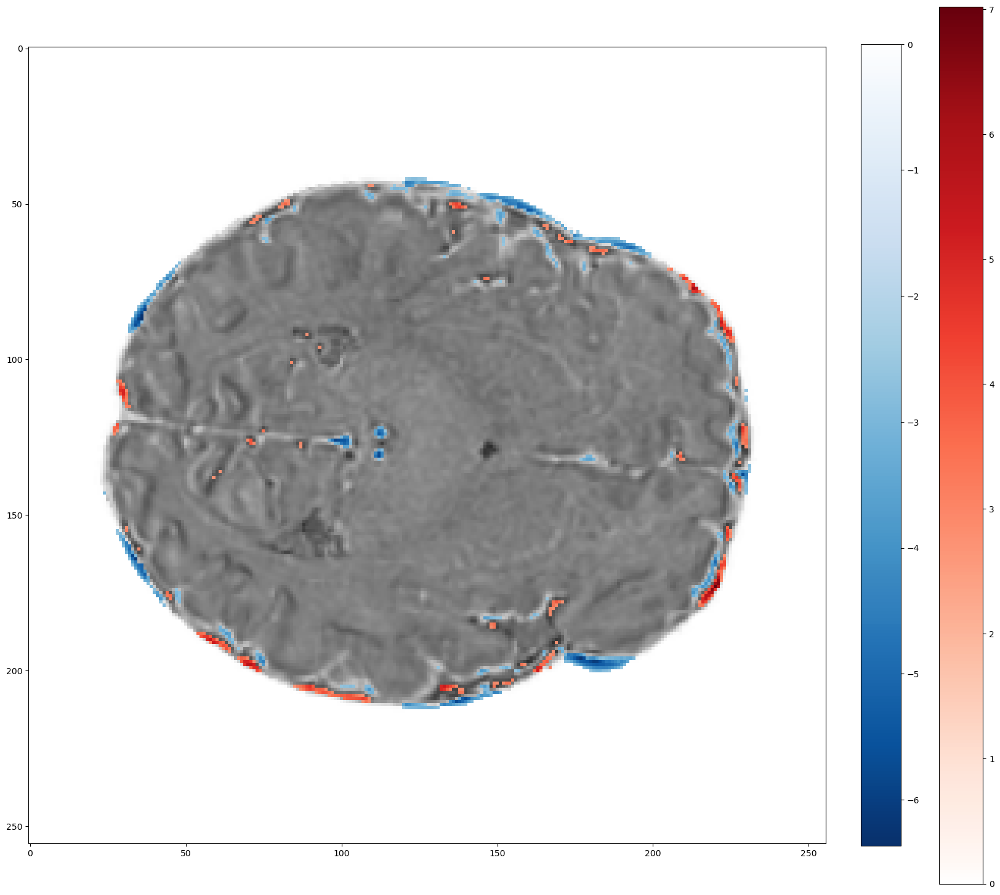

In [19]:
### Get diff on sum of t1/t2 (abs on pred)

og_avg = (og[0] + og[1]) 
pred_avg = (np.abs(pred[0]) + np.abs(pred[1])) 

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=2.5)

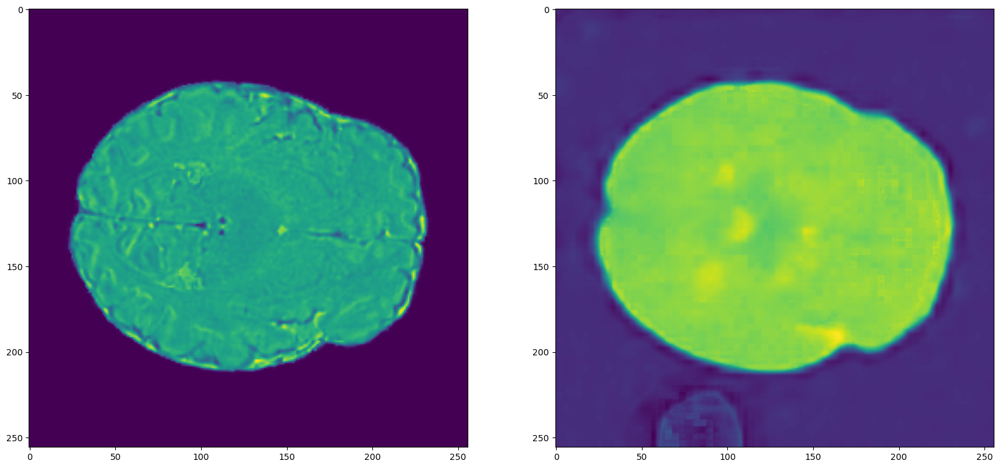

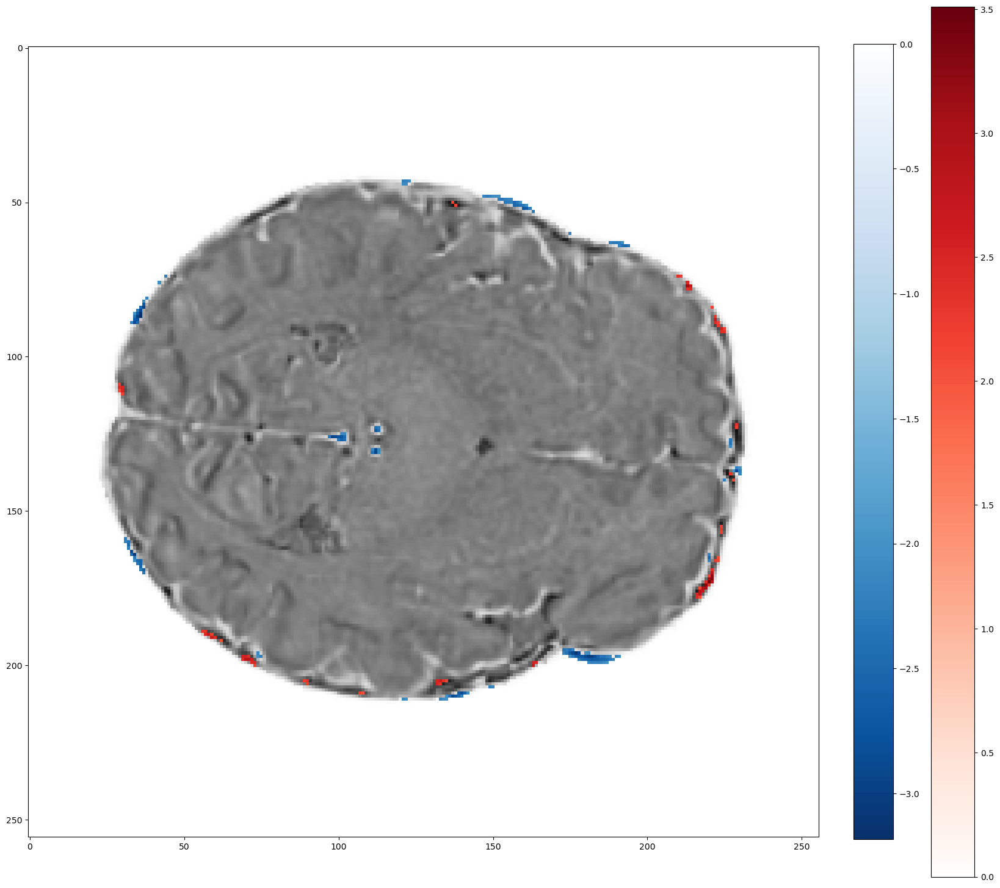

In [27]:
### Get diff on average of t1/t2

og_avg = (og[0] + og[1]) / 2
pred_avg = (pred[0] + pred[1]) / 2

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=2)

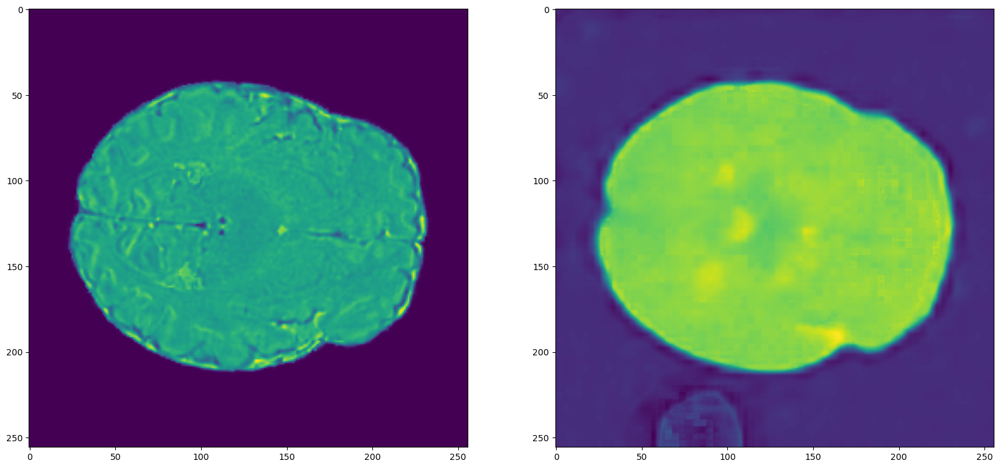

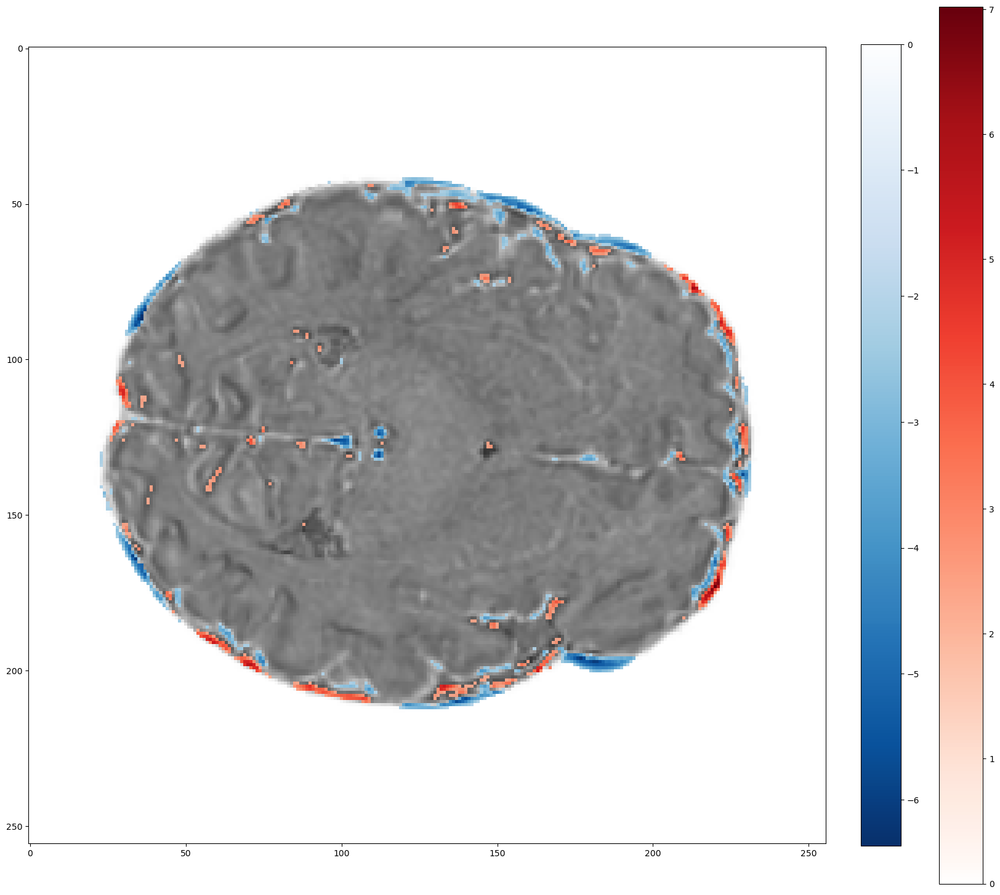

In [120]:
### Get diff on average of t1/t2

og_avg = (og[0] + og[1])
pred_avg = (pred[0] + pred[1])

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=2)

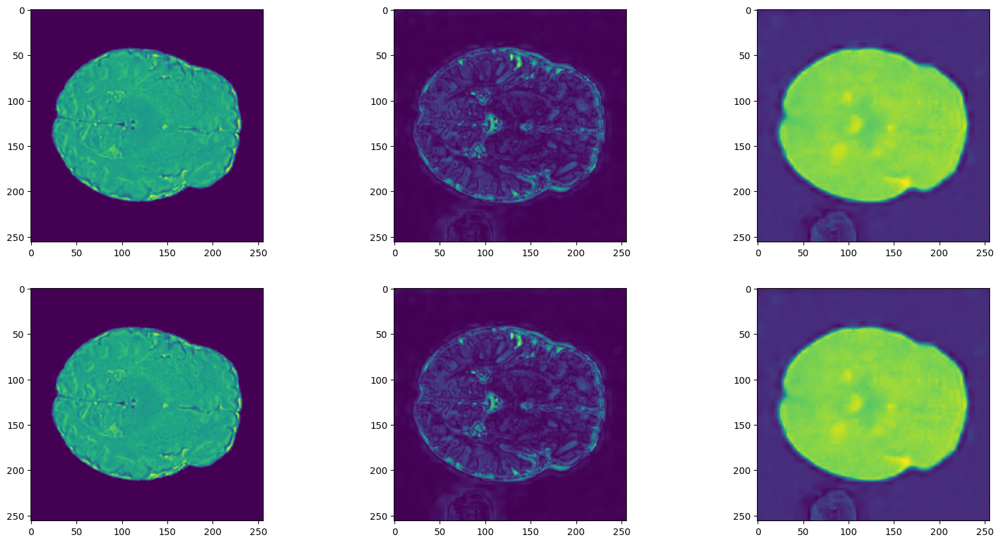

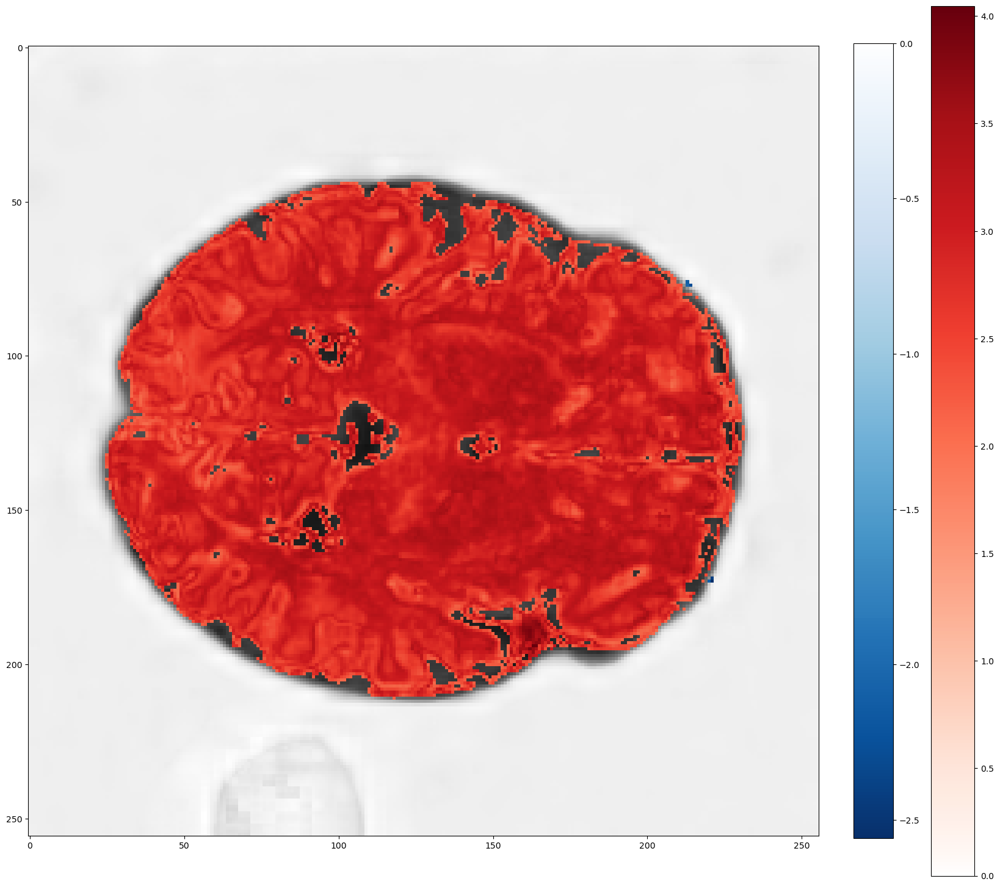

In [36]:
### Get diff on Absolute Values

t1_diff = og[0] - pred[0]
t2_diff = og[1] - pred[1]

og_sum = og[0] + og[1]
absolute_sum = np.abs(t1_diff) + np.abs(t2_diff)
pred_sum = (pred[0] + pred[1])

og_avg = og_sum / 2
absolute_avg = absolute_sum / 2
pred_avg = pred_sum / 2

fig, ax = plt.subplots(2, 3, figsize=(20,10))
ax[0][0].imshow(og_sum[:,:,128])
ax[0][1].imshow(absolute_sum[:,:,128])
ax[0][2].imshow(pred_sum[:,:,128])
ax[1][0].imshow(og_avg[:,:,128])
ax[1][1].imshow(absolute_avg[:,:,128])
ax[1][2].imshow(pred_avg[:,:,128])

brain_diff(pred_avg[:,:,128], absolute_avg[:,:,128], threshold=2)

### Test Visualization

In [97]:
# interesting indices at 4, 7, 14

SSIM:  0.6776044137457353


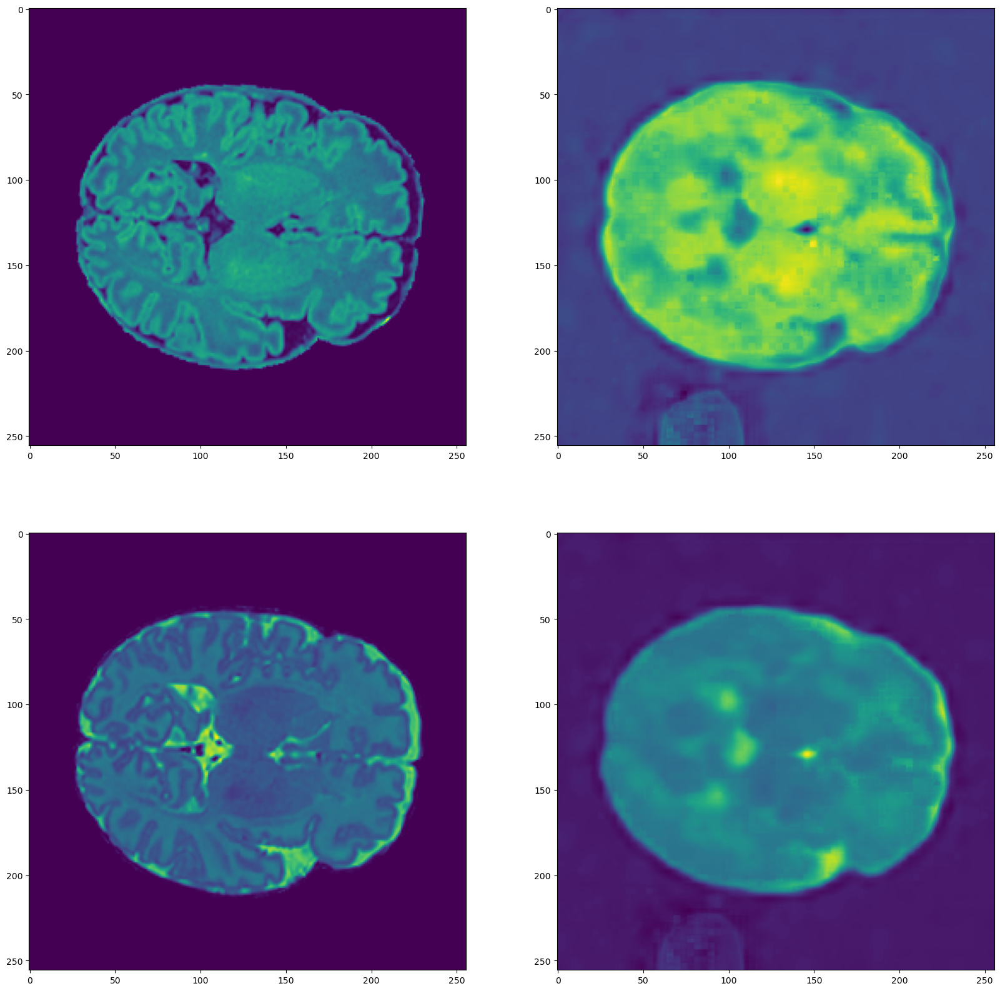

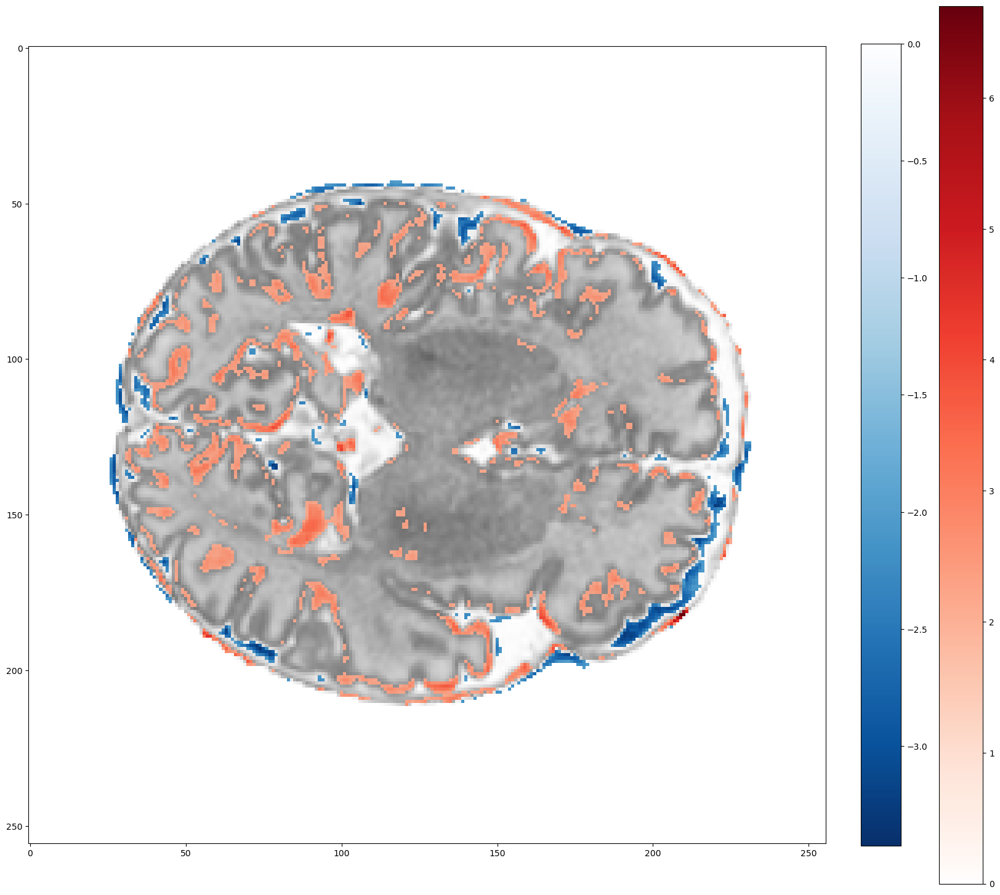

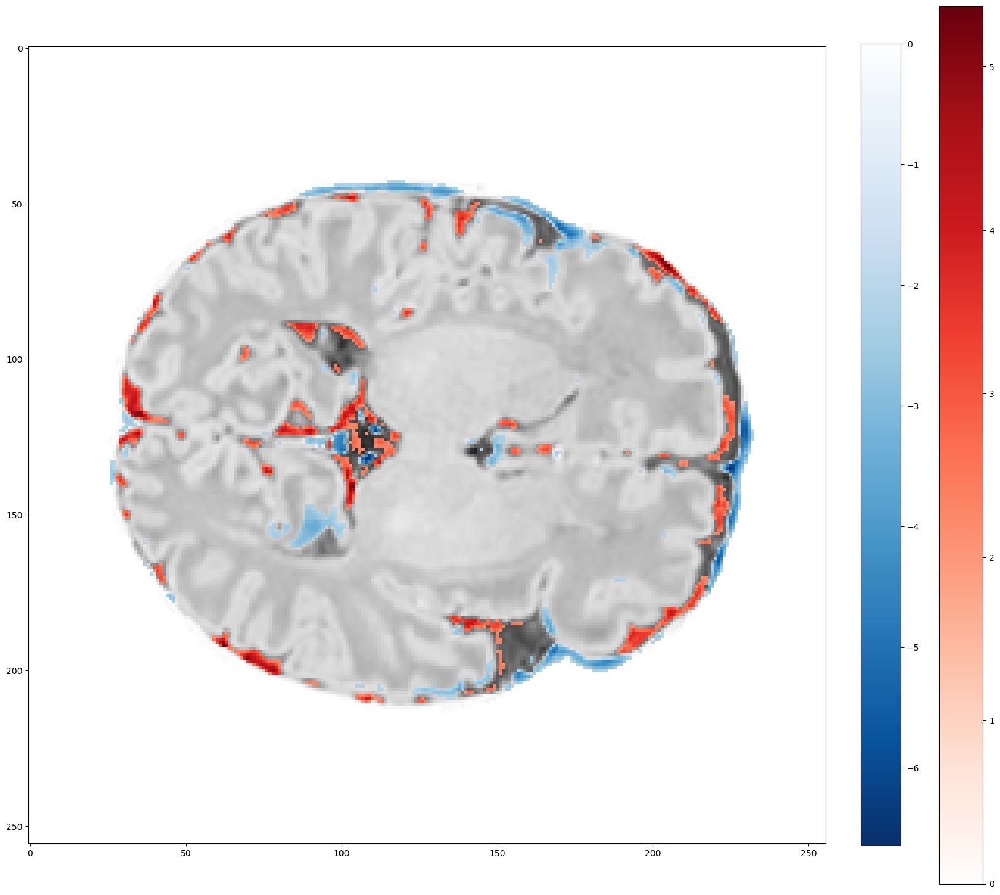

In [20]:
index = 6
x = torch.Tensor(np.reshape(test[index], (1, 2, 256, 256, 256))).cuda()
output = model(x)

og = np.reshape(x.cpu().detach().numpy(), (2, 256, 256, 256))
pred = np.reshape(output.cpu().detach().numpy(), (2, 256, 256, 256))

(score, diff) = ssim(og[0][:,:,s], pred[0][:,:,s], full=True)
print("SSIM: ", score)

s = 128
fig, ax = plt.subplots(2, 2, figsize=(20,20))
ax[0][0].imshow(og[0][:,:,s])
ax[0][1].imshow(pred[0][:,:,s])
ax[1][0].imshow(og[1][:,:,s])
ax[1][1].imshow(pred[1][:,:,s])

brain_diff(og[0][:,:,s], pred[0][:,:,s], threshold=2)
brain_diff(og[1][:,:,s], pred[1][:,:,s], threshold=2)

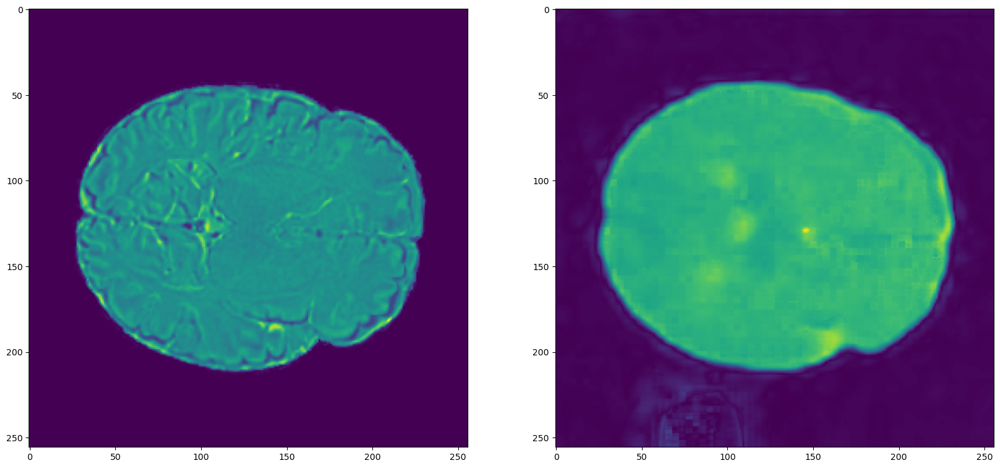

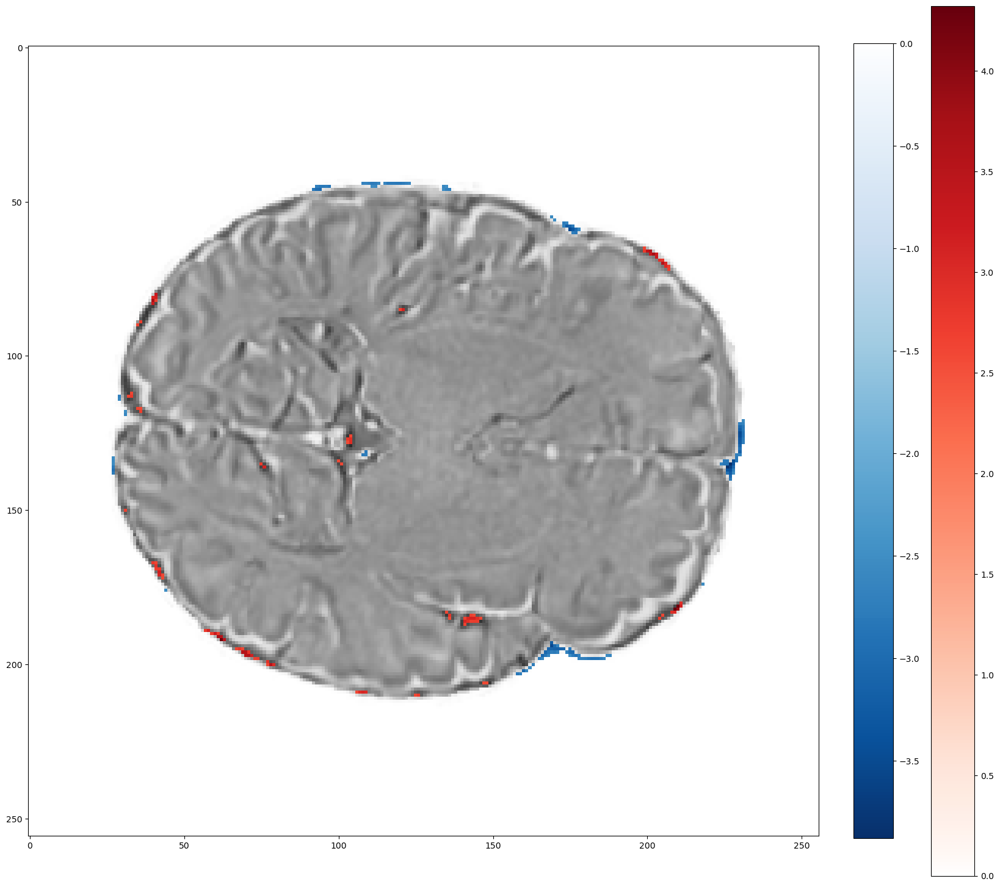

In [22]:
### Get diff on sum of t1/t2 (abs on pred)

og_avg = (og[0] + og[1]) / 2
pred_avg = (np.abs(pred[0]) + np.abs(pred[1])) / 2

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=2.5)

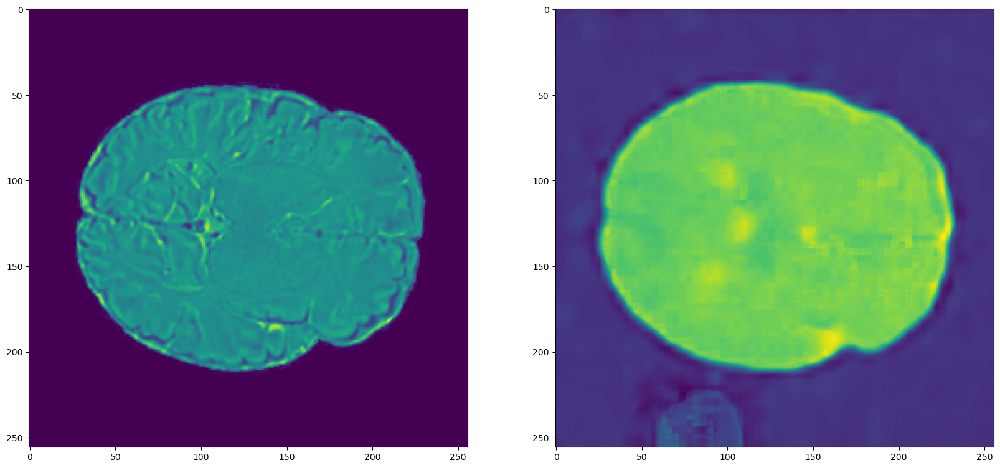

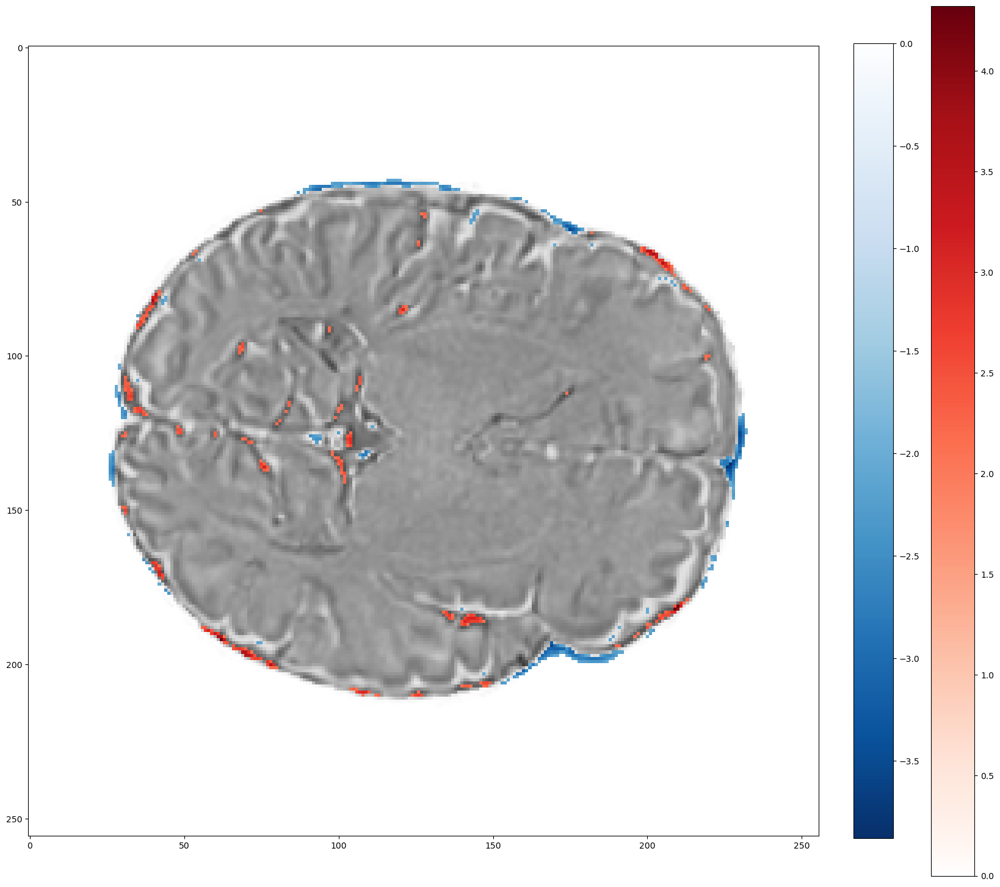

In [110]:
### Get diff on average of t1/t2

og_avg = (og[0] + og[1]) / 2
pred_avg = (pred[0] + pred[1]) / 2

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=2)

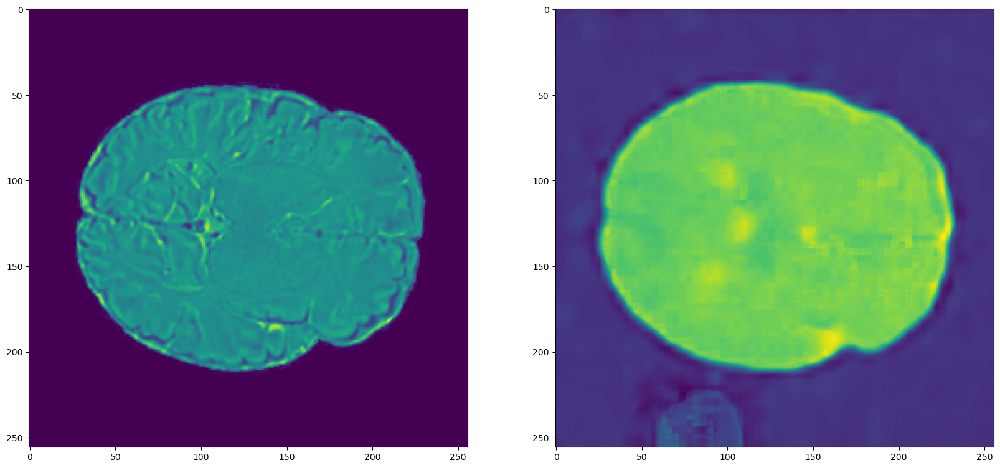

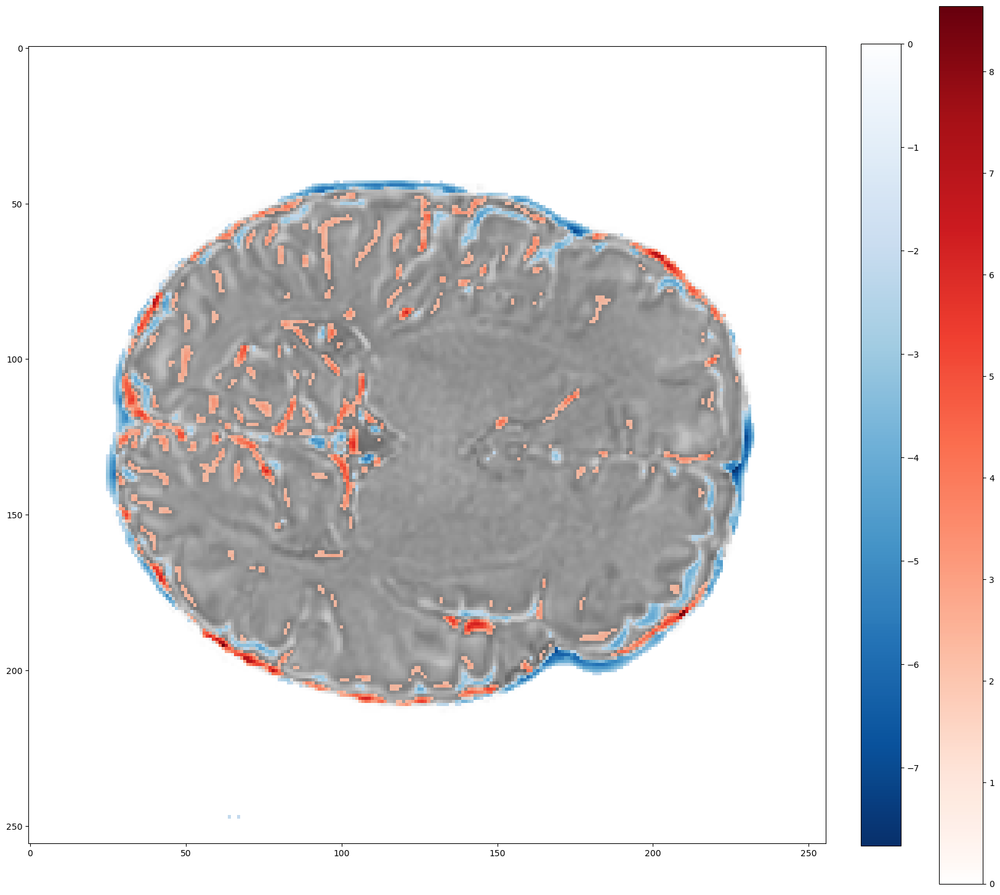

In [16]:
### Get diff on sum of t1/t2

og_avg = (og[0] + og[1])
pred_avg = (pred[0] + pred[1]) 

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=2)

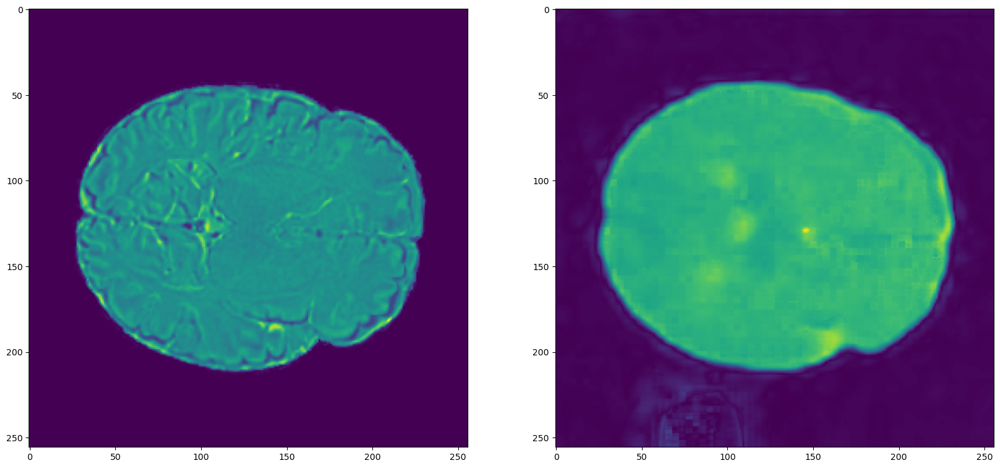

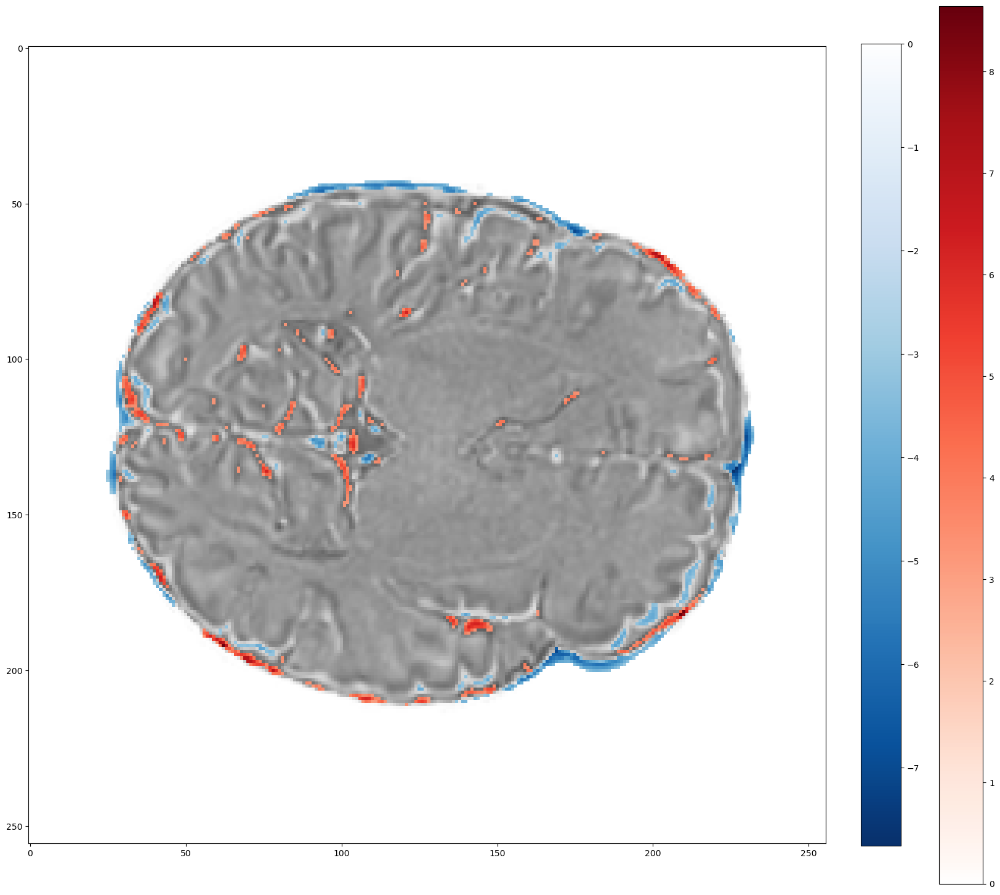

In [18]:
### Get diff on sum of t1/t2 (abs on pred)

og_avg = (og[0] + og[1])
pred_avg = (np.abs(pred[0]) + np.abs(pred[1]))

fig, ax = plt.subplots(1, 2, figsize=(20,20))
ax[0].imshow(og_avg[:,:,s])
ax[1].imshow(pred_avg[:,:,s])

brain_diff(og_avg[:,:,s], pred_avg[:,:,s], threshold=3)

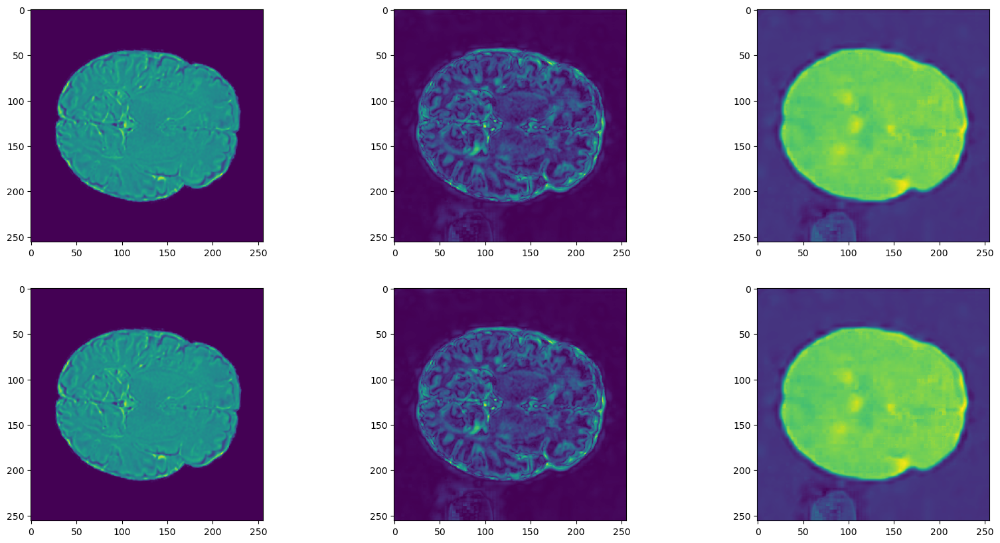

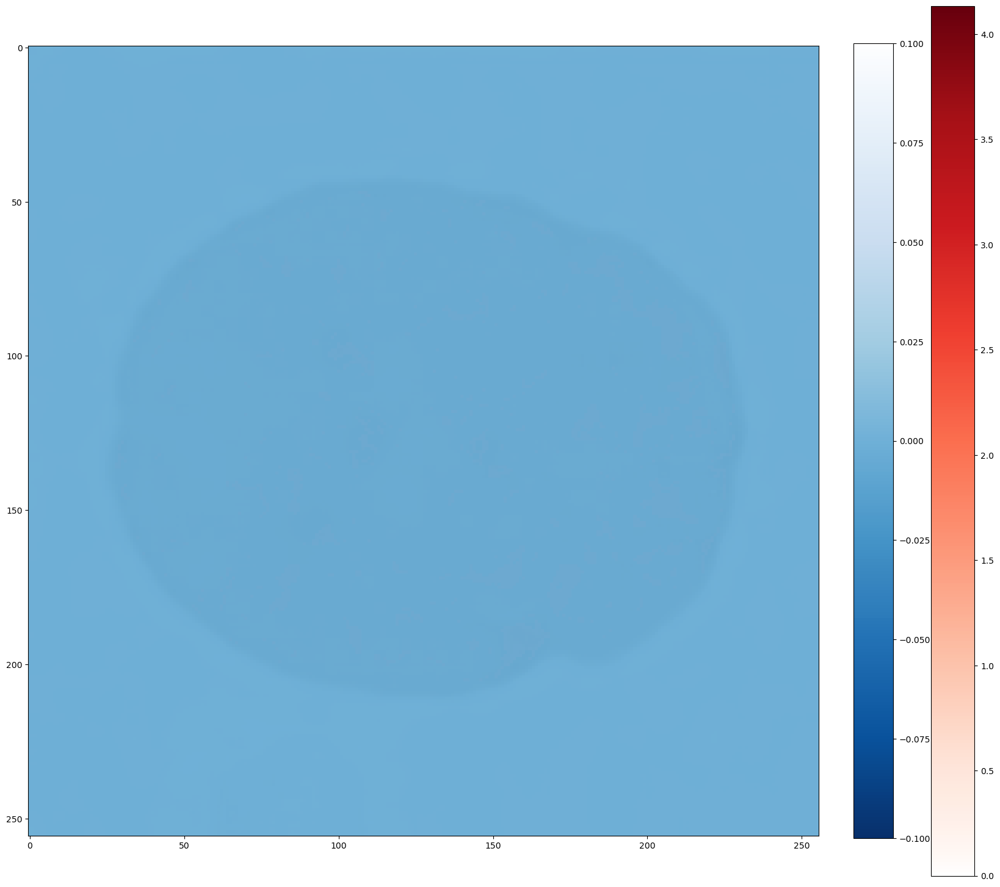

In [48]:
### Get diff on Absolute Values

t1_diff = og[0] - pred[0]
t2_diff = og[1] - pred[1]

og_sum = og[0] + og[1]
absolute_sum = np.abs(t1_diff) + np.abs(t2_diff)
pred_sum = (pred[0] + pred[1])

og_avg = og_sum / 2
absolute_avg = absolute_sum / 2
pred_avg = pred_sum / 2

fig, ax = plt.subplots(2, 3, figsize=(20,10))
ax[0][0].imshow(og_sum[:,:,128])
ax[0][1].imshow(absolute_sum[:,:,128])
ax[0][2].imshow(pred_sum[:,:,128])
ax[1][0].imshow(og_avg[:,:,128])
ax[1][1].imshow(absolute_avg[:,:,128])
ax[1][2].imshow(pred_avg[:,:,128])

brain_diff(pred_avg[:,:,128], absolute_avg[:,:,128], threshold=3)